In [1]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import fashion_mnist
((images_train, _), (_, _)) = fashion_mnist.load_data()

4422102/4422102 [==============================] - 1s 0us/step


In [2]:
randomDim=100
images_train=(np.array(images_train).astype(np.float32) - 127.5)/127.5 # gives values between -1 and 1
images_train.shape

(60000, 28, 28)

In [3]:
images_train=images_train.reshape(60000,28*28)
images_train.shape

(60000, 784)

In [4]:
from tensorflow.keras.layers import Input, Dense, Dropout, LeakyReLU
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import initializers

Use of question mark below pulls up help in sidebar



In [5]:
Dense?

In [6]:
Dense

keras.src.layers.core.dense.Dense

In [7]:
generator = Sequential()
generator.add(Dense(256, input_dim=randomDim, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
generator.add(LeakyReLU(0.2)) # LeakyReLU add some noise, and prevents overfitting, whichb is useful in the case of GANS
generator.add(Dense(512))
generator.add(LeakyReLU(0.2))
generator.add(Dense(1024))
generator.add(LeakyReLU(0.2))
generator.add(Dense(784, activation='tanh'))   # sigmoid[0,1], tanh[-1,1] (tanh allows for larger steps whilst training)
generator.compile(loss='binary_crossentropy', optimizer='adam')

In [8]:
discriminator=Sequential()
discriminator.add(Dense(1024, input_dim=784, kernel_initializer=initializers.RandomNormal(stddev=0.02)))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Dropout(0.3))
discriminator.add(Dense(512))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Dropout(0.3))
discriminator.add(Dense(256))
discriminator.add(LeakyReLU(0.2))
discriminator.add(Dropout(0.3))
discriminator.add(Dense(1, activation='sigmoid'))
discriminator.compile(loss='binary_crossentropy', optimizer='adam')

In [9]:
discriminator.trainable=False

ganInput=Input(shape=(randomDim,))
x=generator(ganInput)
ganOutput=discriminator(x)
gan=Model(inputs=ganInput, outputs=ganOutput)
gan.compile(loss='binary_crossentropy', optimizer='adam')

In [10]:
def plotGeneratedImages(epoch, examples=100, dim=(10, 10), figsize=(20, 20)):
  noise = np.random.normal(0, 1, size=[examples, randomDim])
  generatedImages = generator.predict(noise)
  generatedImages = generatedImages.reshape(examples, 28, 28)

  plt.figure(figsize=figsize)
  for i in range(generatedImages.shape[0]):
    plt.subplot(dim[0], dim[1], i+1)
    plt.imshow(generatedImages[i], interpolation='nearest', cmap='gray_r')
    plt.axis('off')
  plt.tight_layout()
  plt.savefig('gan_generated_image_epoch_%d.png' % epoch)



In [11]:
def train(epochs=1, batchsize=128):
  batchcount=images_train.shape[0]//batchsize
  print('Epochs:', epochs)
  print('Batch size:', batchsize)
  print('Batches per epoch', batchcount)

  for e in range(0, epochs):
      print('-'*15, 'Epoch %d' % e, '-'*15)
      for _ in range(batchcount):
        noise=np.random.normal(0,1,size=[batchsize, randomDim])
        imageBatch=images_train[np.random.randint(0,images_train.shape[0], size=batchsize)]

        # generate fake images
        generatedImages=generator.predict(noise)
        X=np.concatenate([imageBatch, generatedImages])

        yDis=np.zeros(2*batchsize)
        yDis[:batchsize]=0.9

        # train discriminator
        discriminator.trainable=True
        dloss=discriminator.train_on_batch(X, yDis)

        # train generator
        noise=np.random.normal(0, 1, size=[batchsize, randomDim])
        yGen=np.ones(batchsize)
        discriminator.trainable=False
        gloss=gan.train_on_batch(noise, yGen)

        if e == 1 or e % 5 == 0:
          plotGeneratedImages(epoch=e)





Epochs: 50
Batch size: 256
Batches per epoch 234
--------------- Epoch 0 ---------------
4/4 [==============================] - 0s 2ms/step


<ipython-input-10-9bdb29d16cc0>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=figsize)


4/4 [==============================] - 0s 2ms/step
--------------- Epoch 1 ---------------
4/4 [==============================] - 0s 2ms/step


KeyboardInterrupt: 

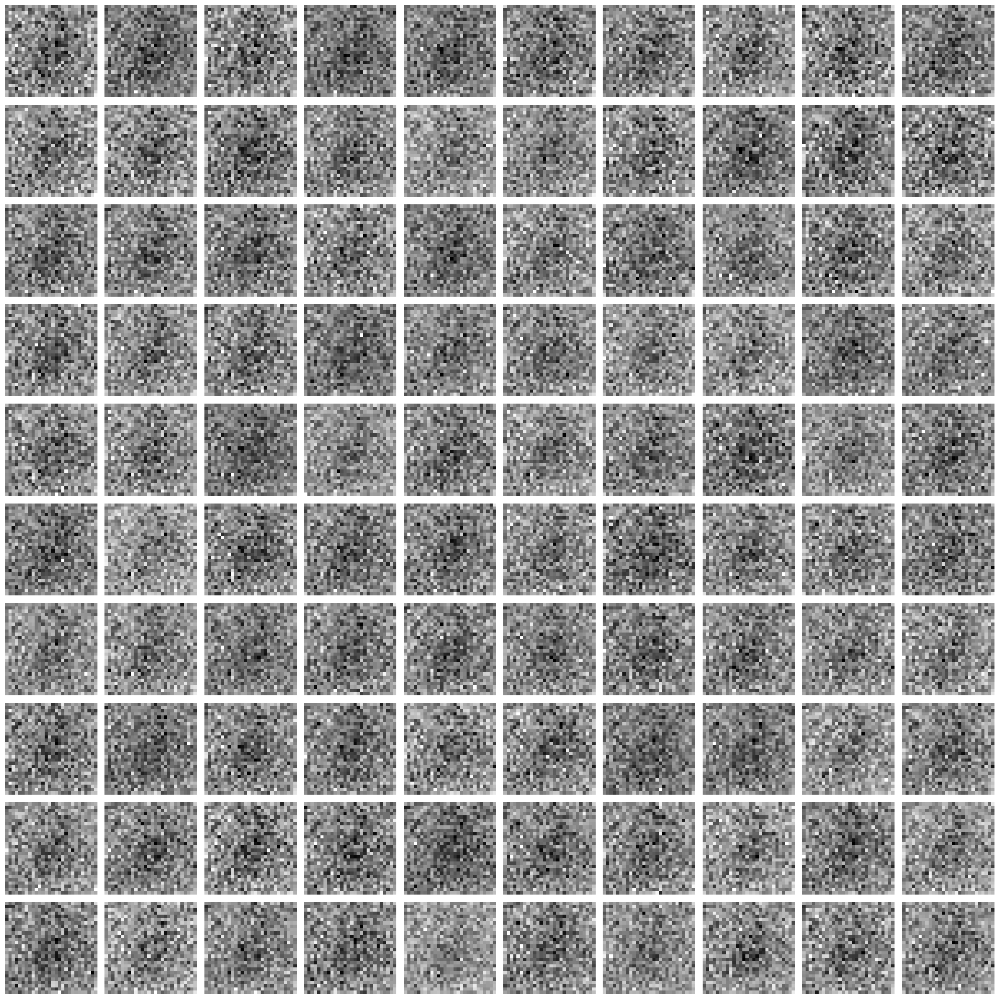

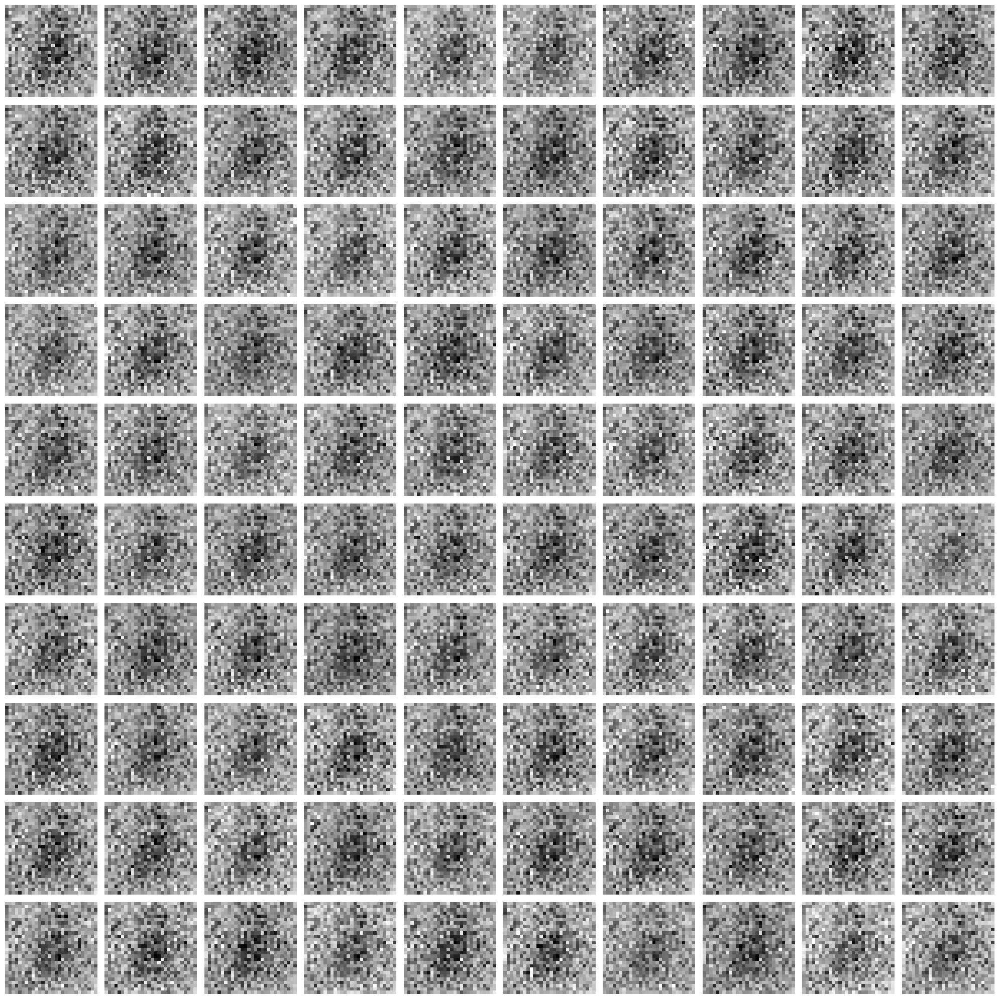

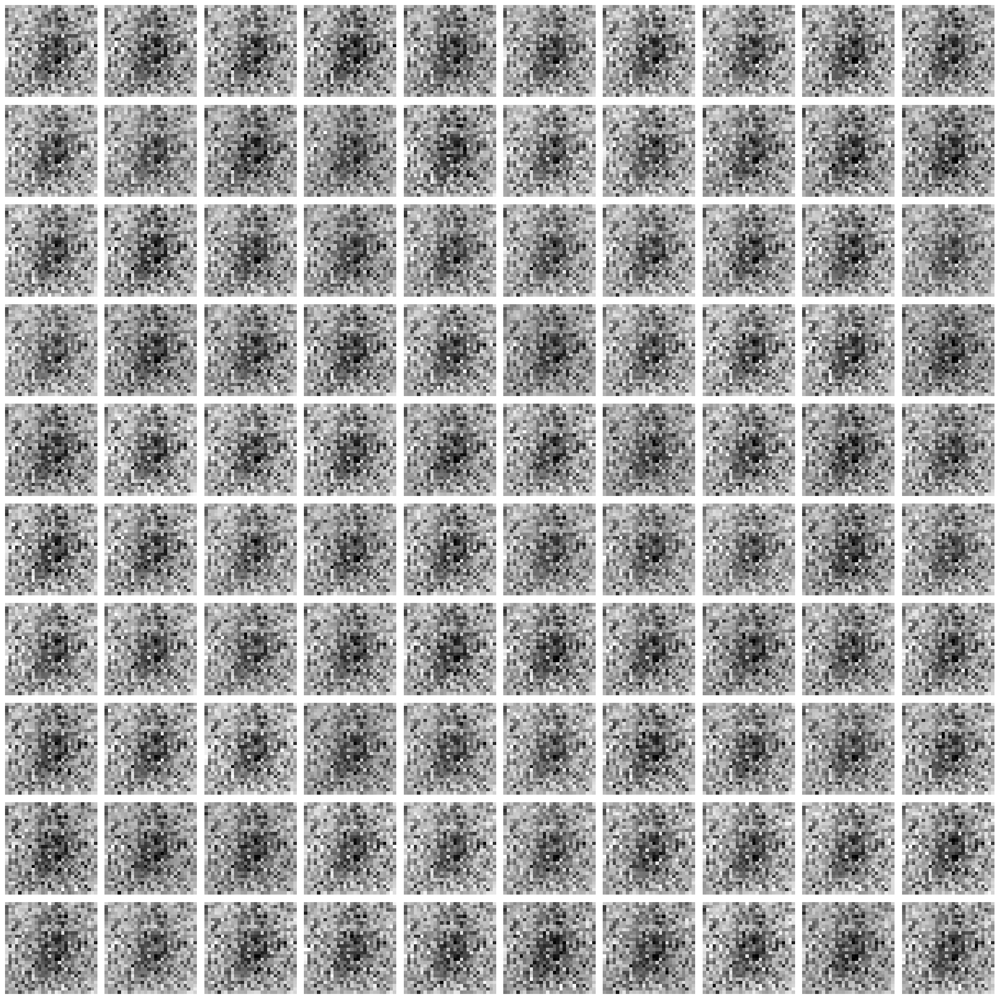

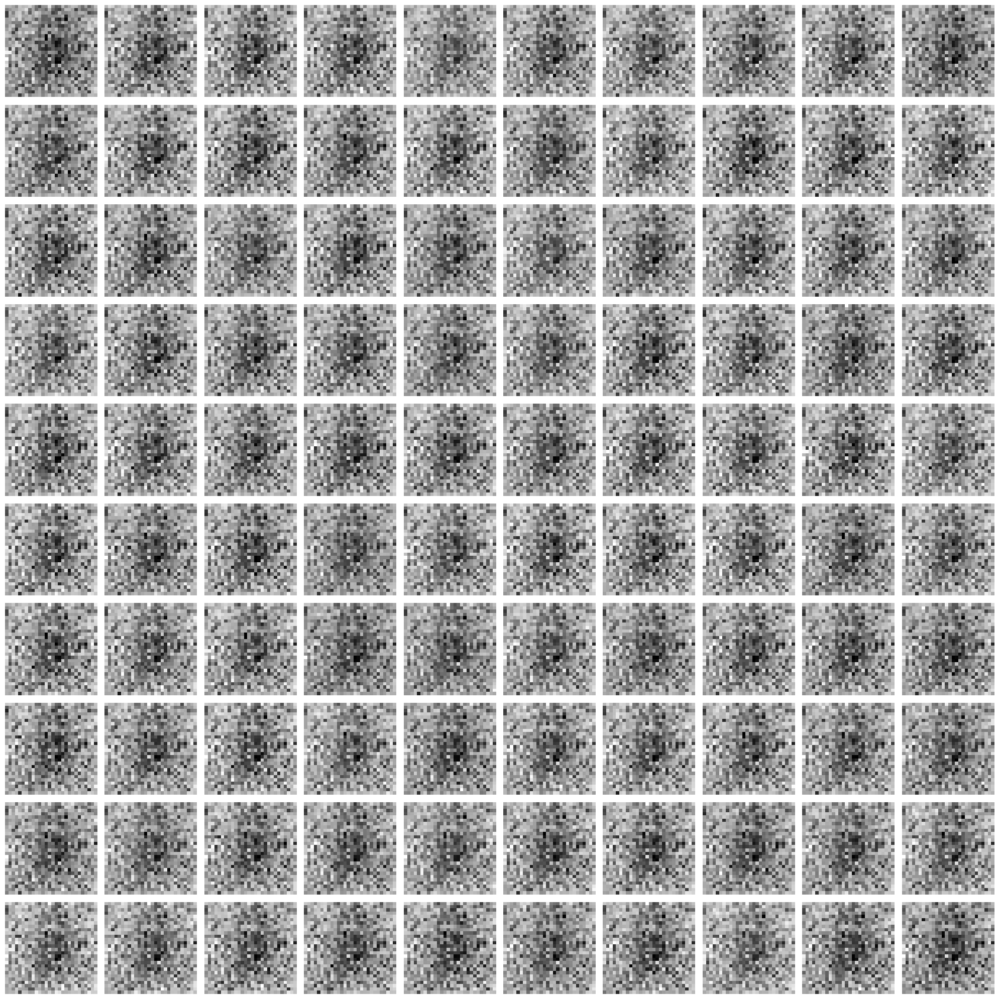

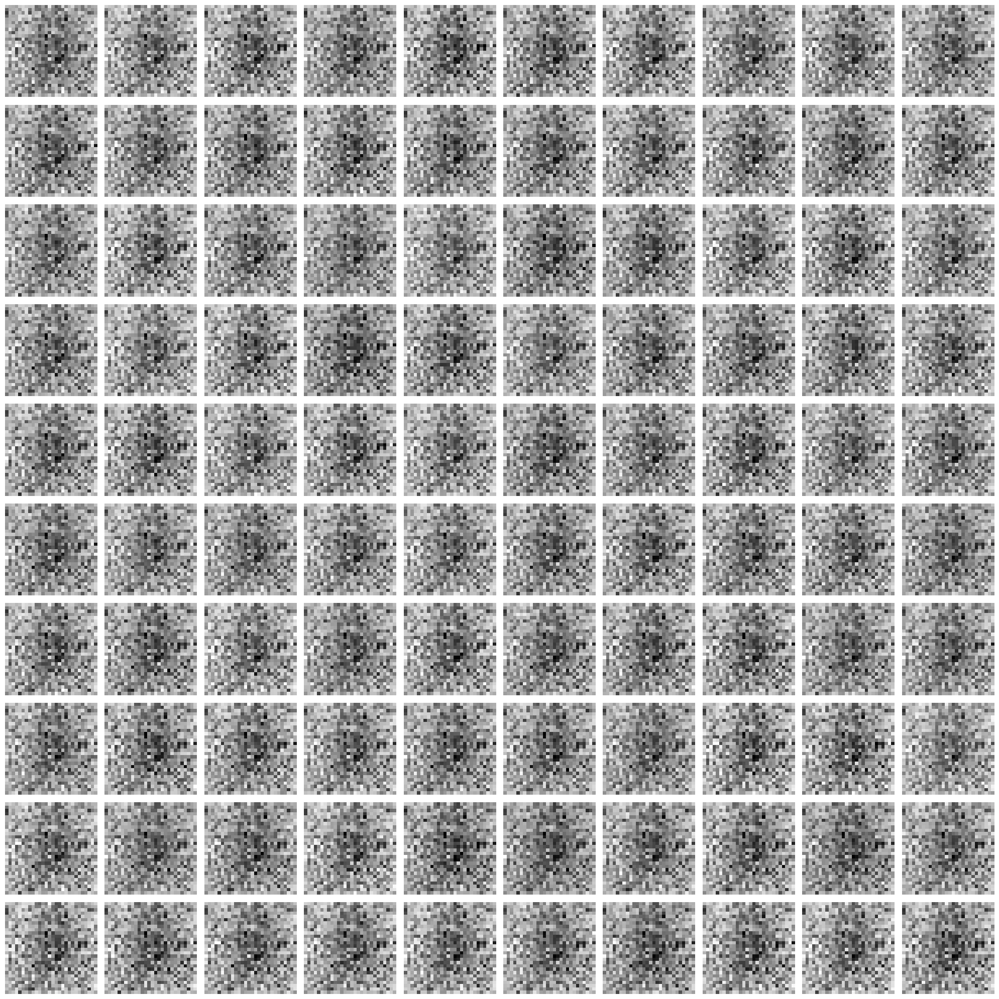

...

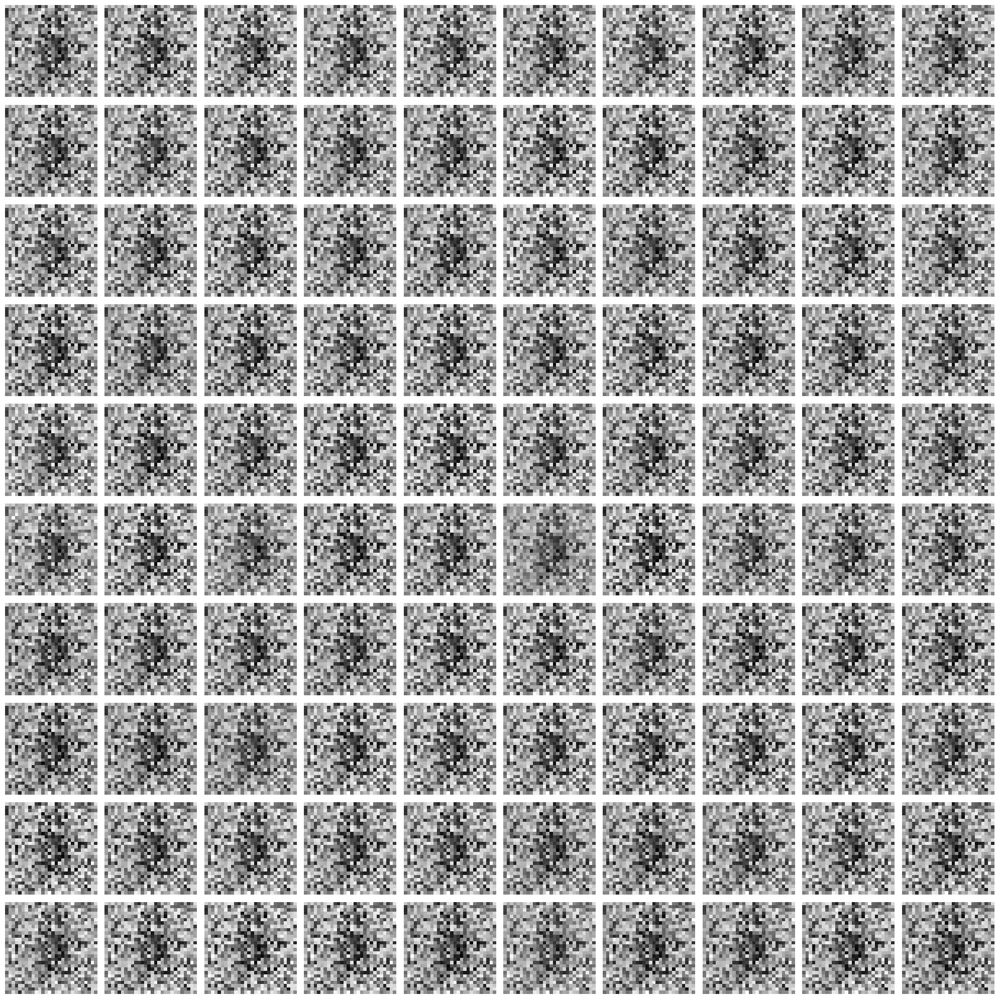

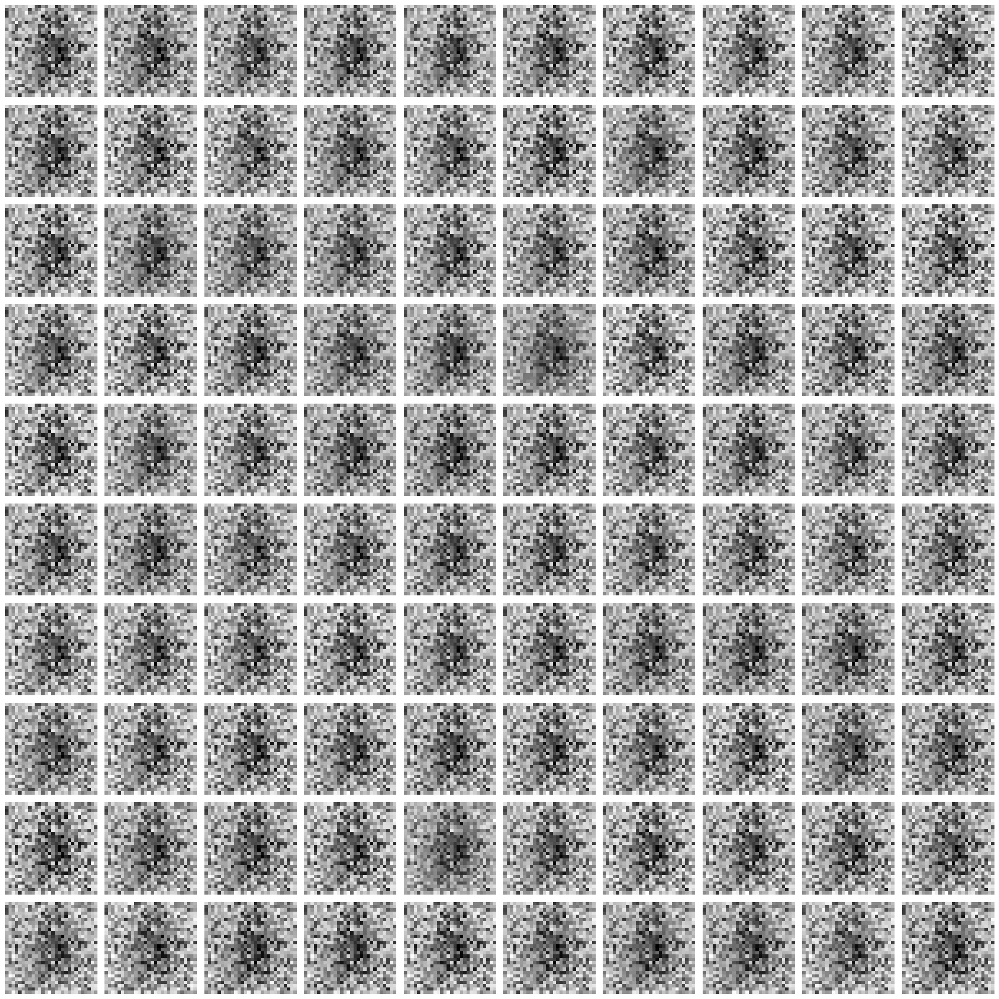

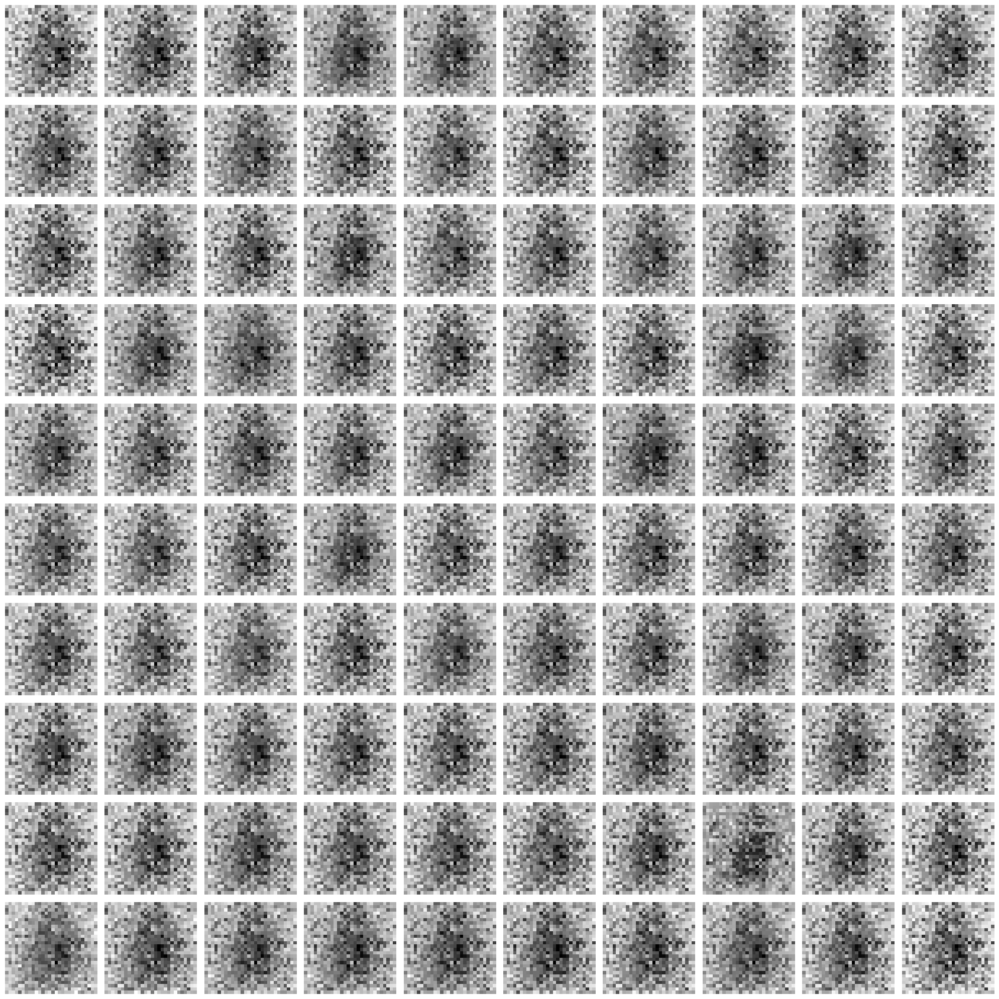

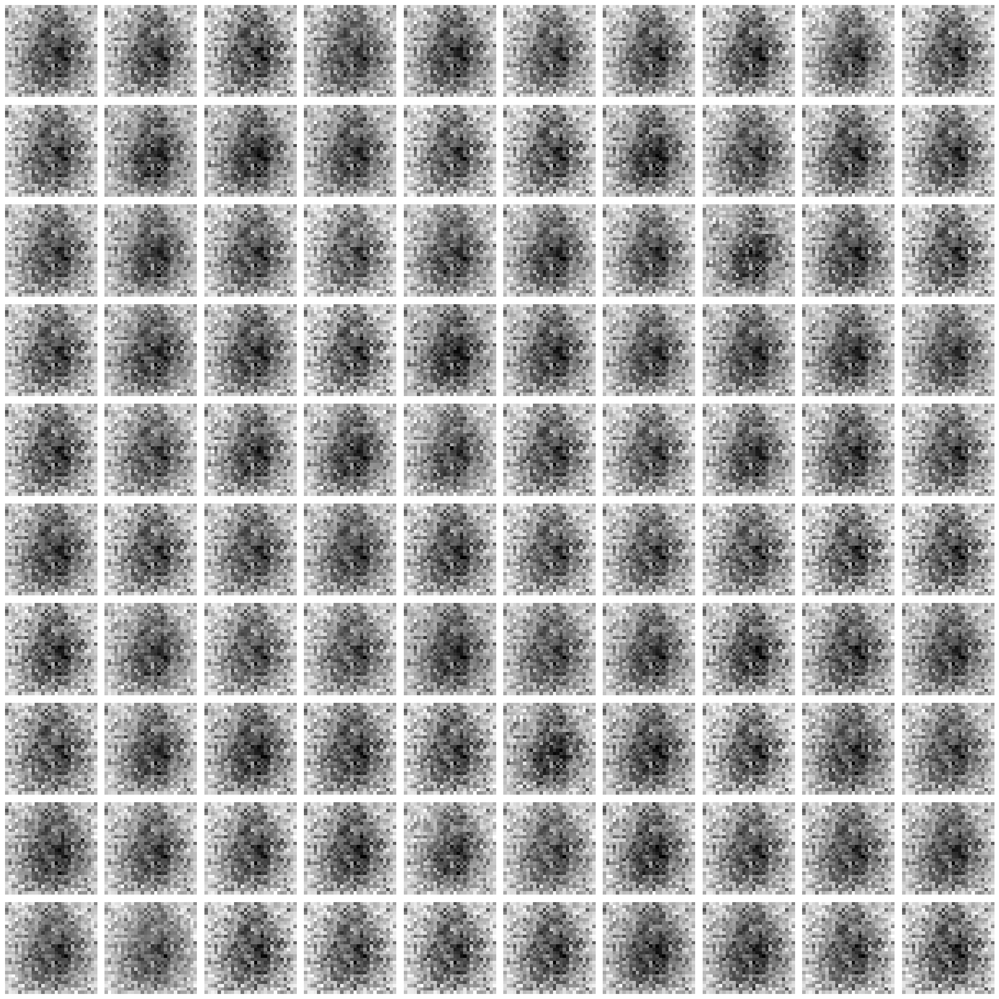

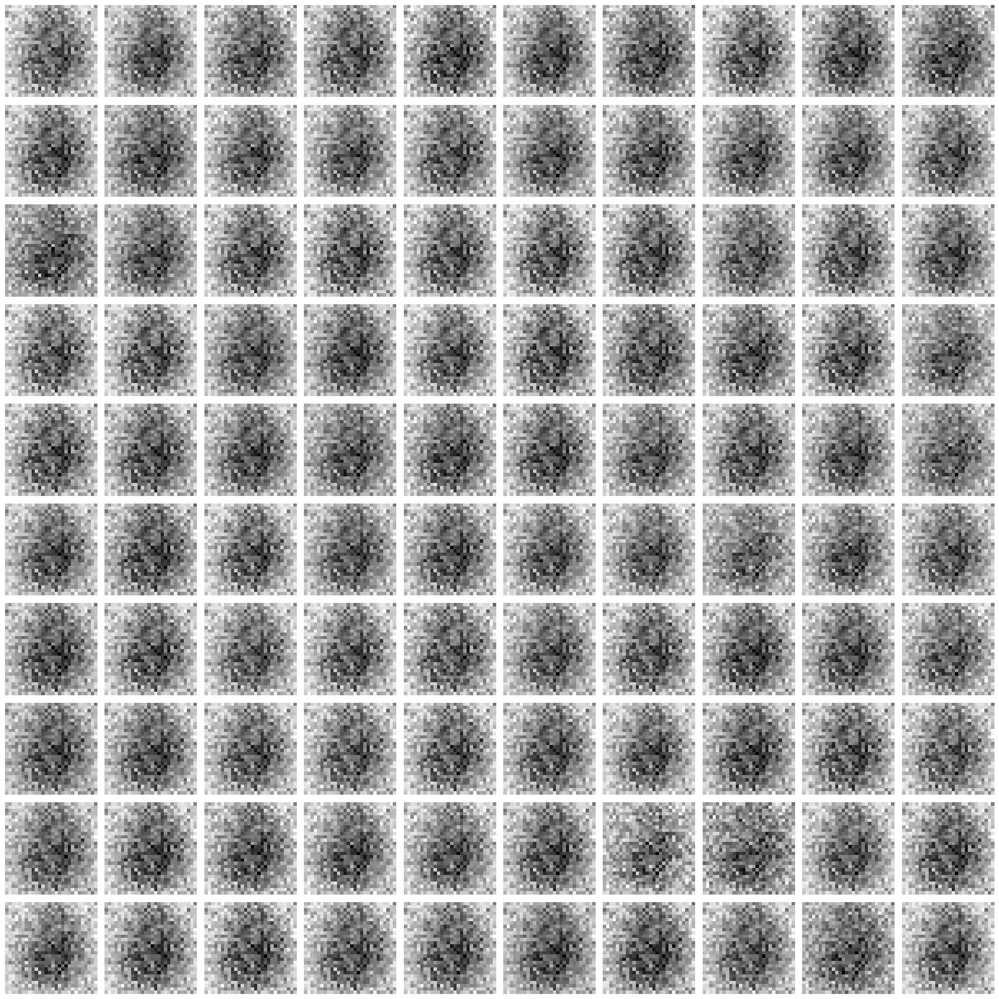

Error in callback <function flush_figures at 0x7dbae380ba30> (for post_execute):


KeyboardInterrupt: 

In [12]:
train(epochs=50, batchsize=256)

Epochs: 50
Batch size: 16384
Batches per epoch 3
--------------- Epoch 0 ---------------
4/4 [==============================] - 0s 2ms/step
--------------- Epoch 1 ---------------
4/4 [==============================] - 0s 2ms/step
--------------- Epoch 2 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 3 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 4 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 5 ---------------
4/4 [==============================] - 0s 2ms/step
--------------- Epoch 6 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 7 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 8 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 9 ---------------
512/512 [==============================] - 1s 1ms/step
-------------

<ipython-input-10-9bdb29d16cc0>:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=figsize)


--------------- Epoch 26 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 27 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 28 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 29 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 30 ---------------
4/4 [==============================] - 0s 2ms/step
--------------- Epoch 31 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 32 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 33 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 34 ---------------
512/512 [==============================] - 1s 1ms/step
--------------- Epoch 35 ---------------
4/4 [==============================] - 0s 2ms/step
--------------- Epoch 36 ---------------
512/512

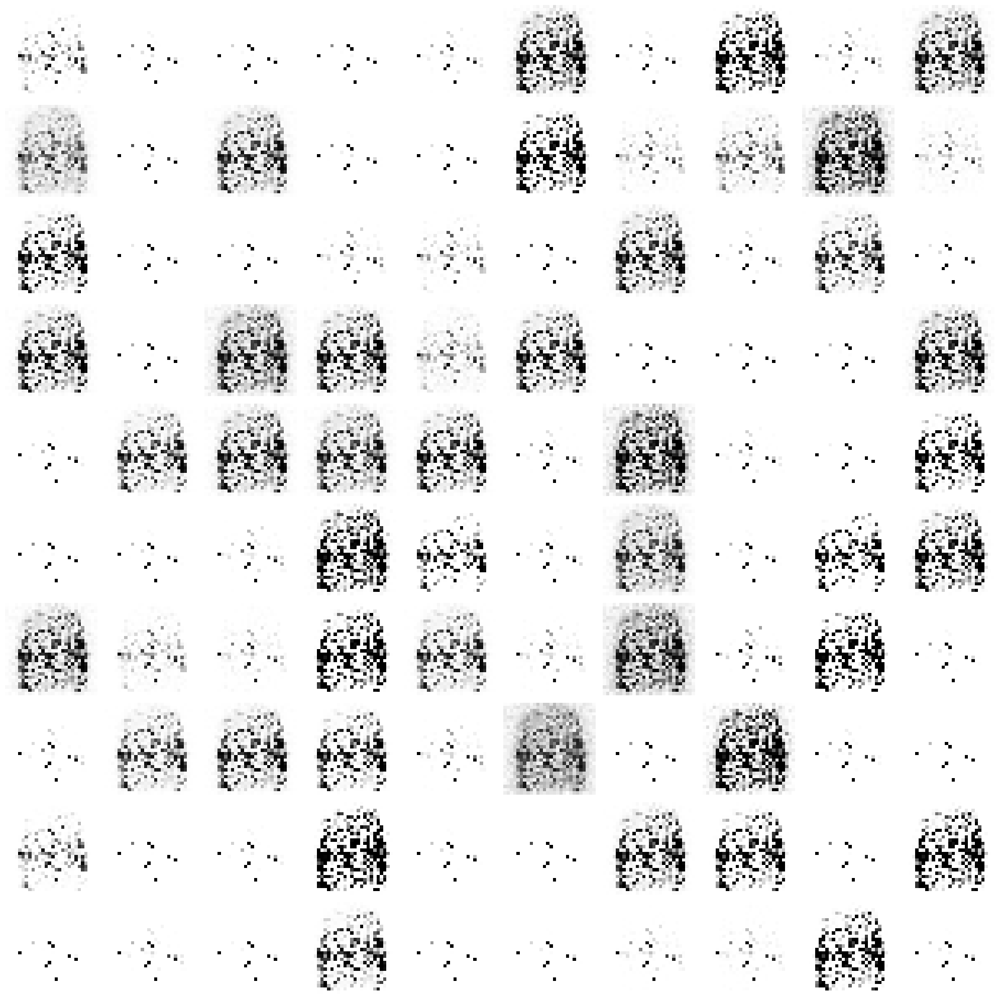

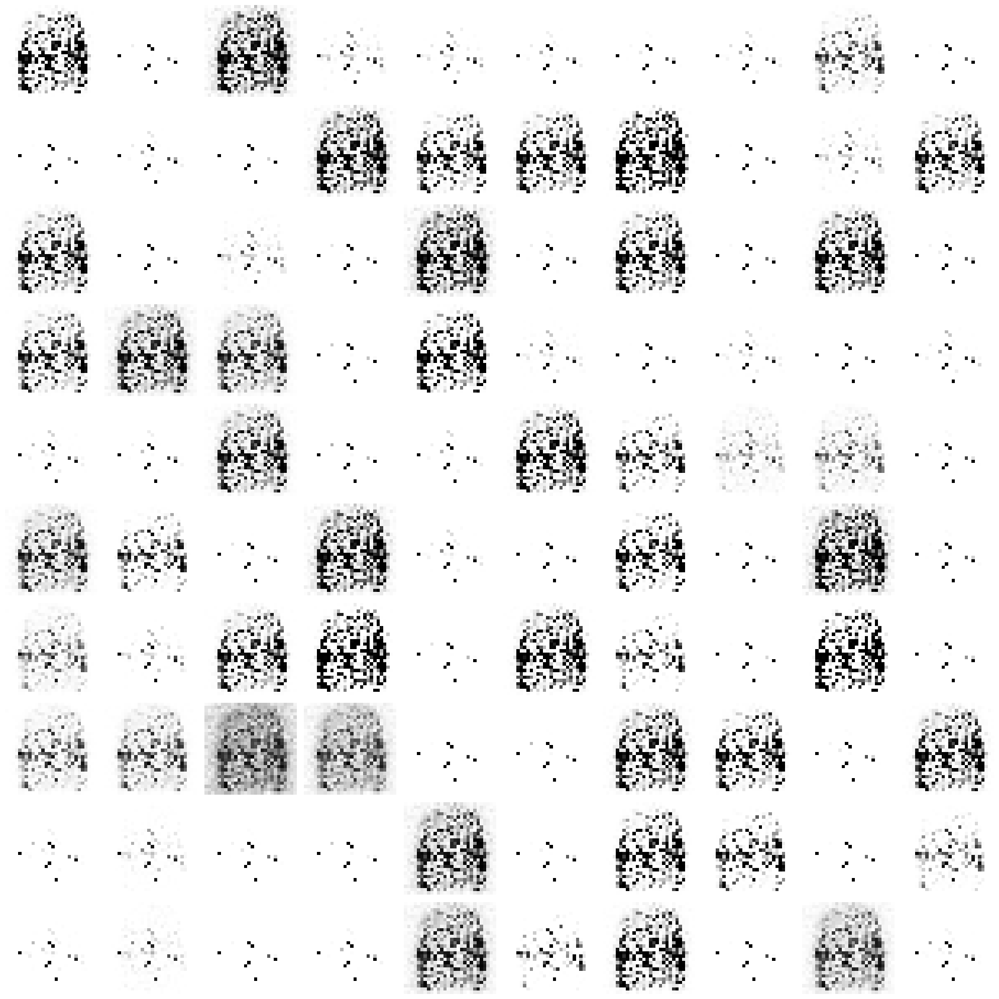

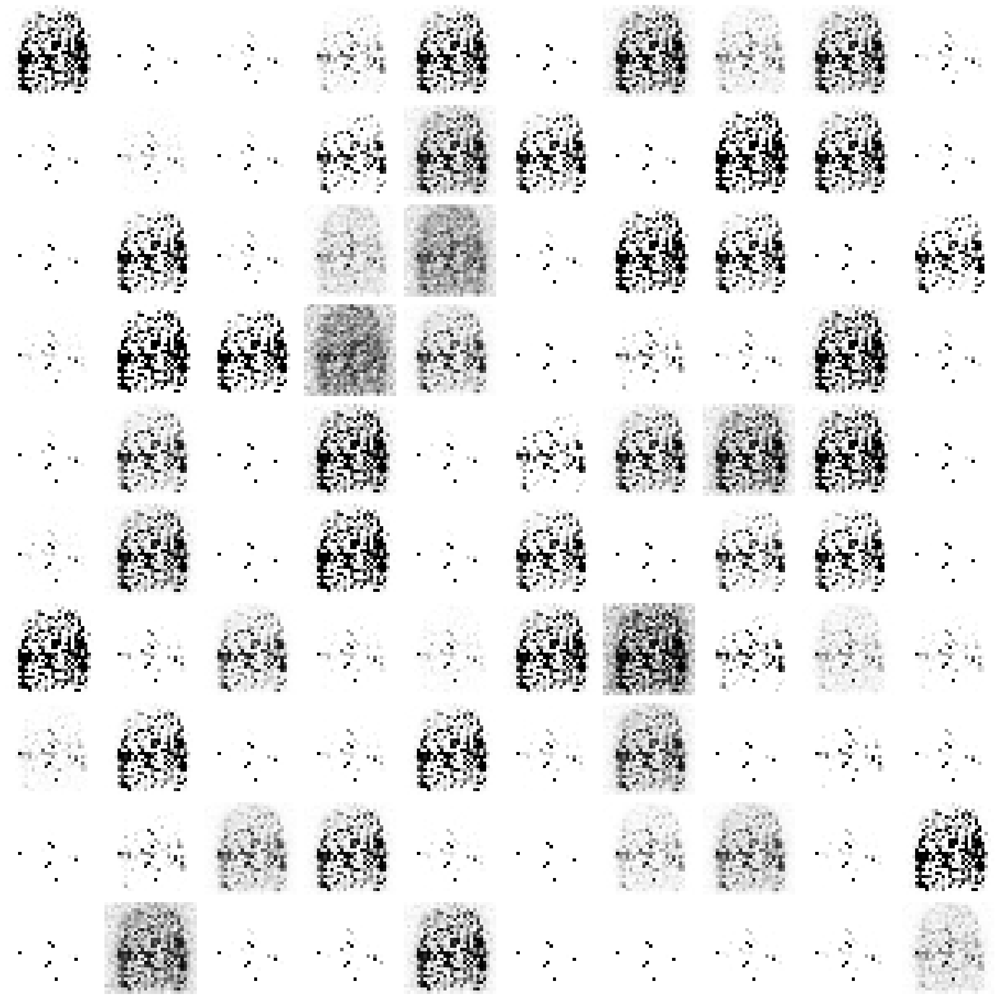

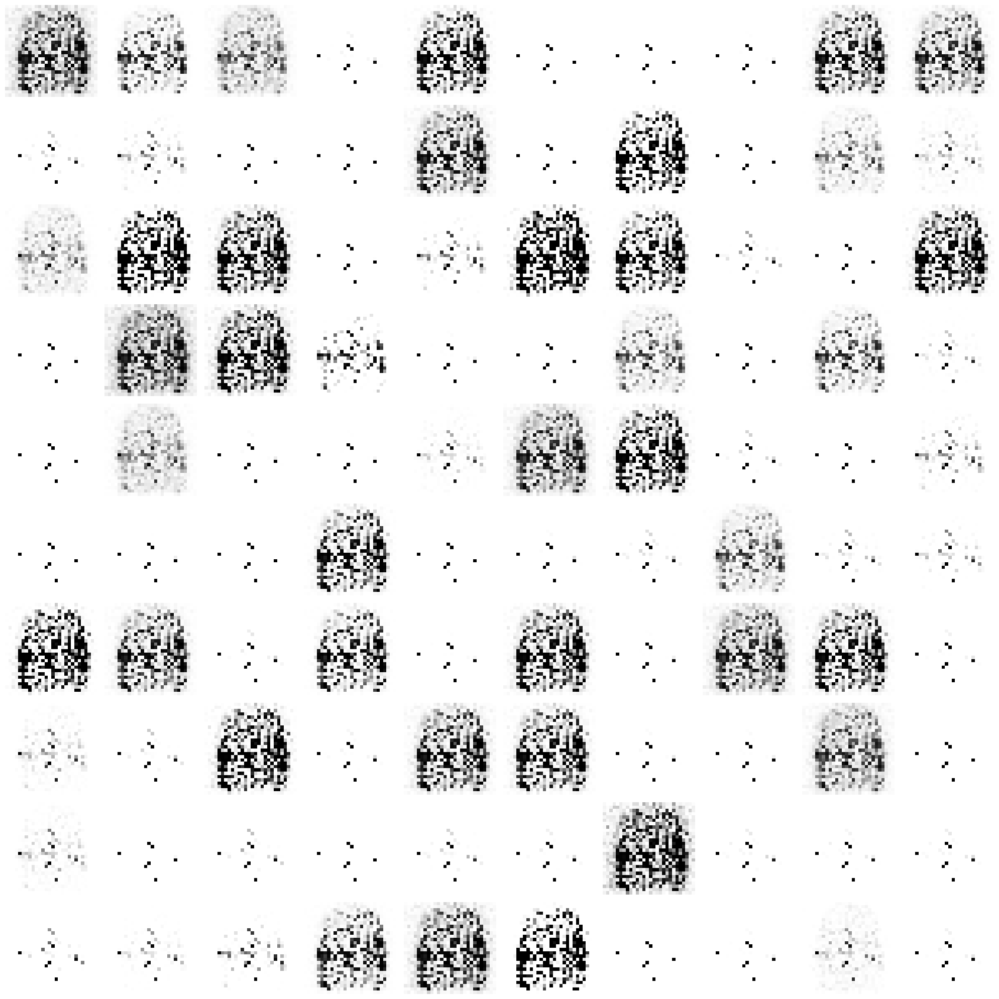

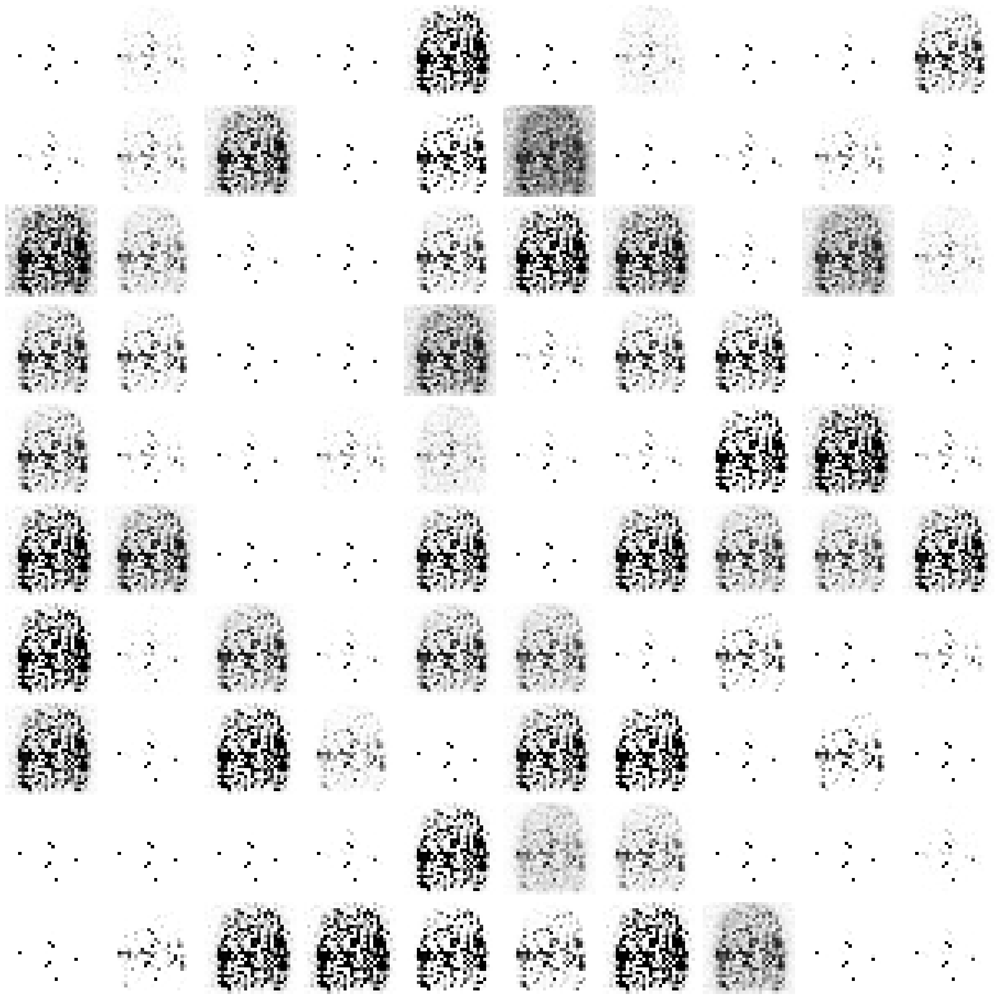

...

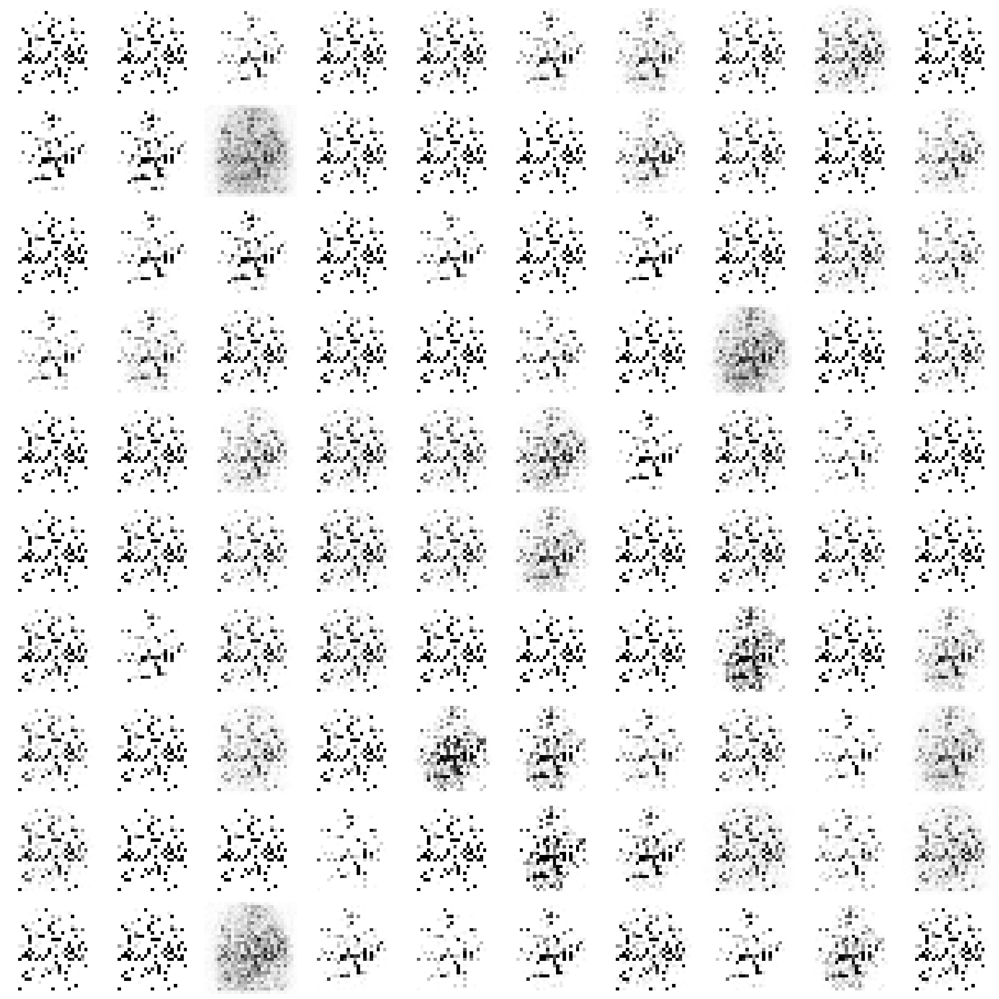

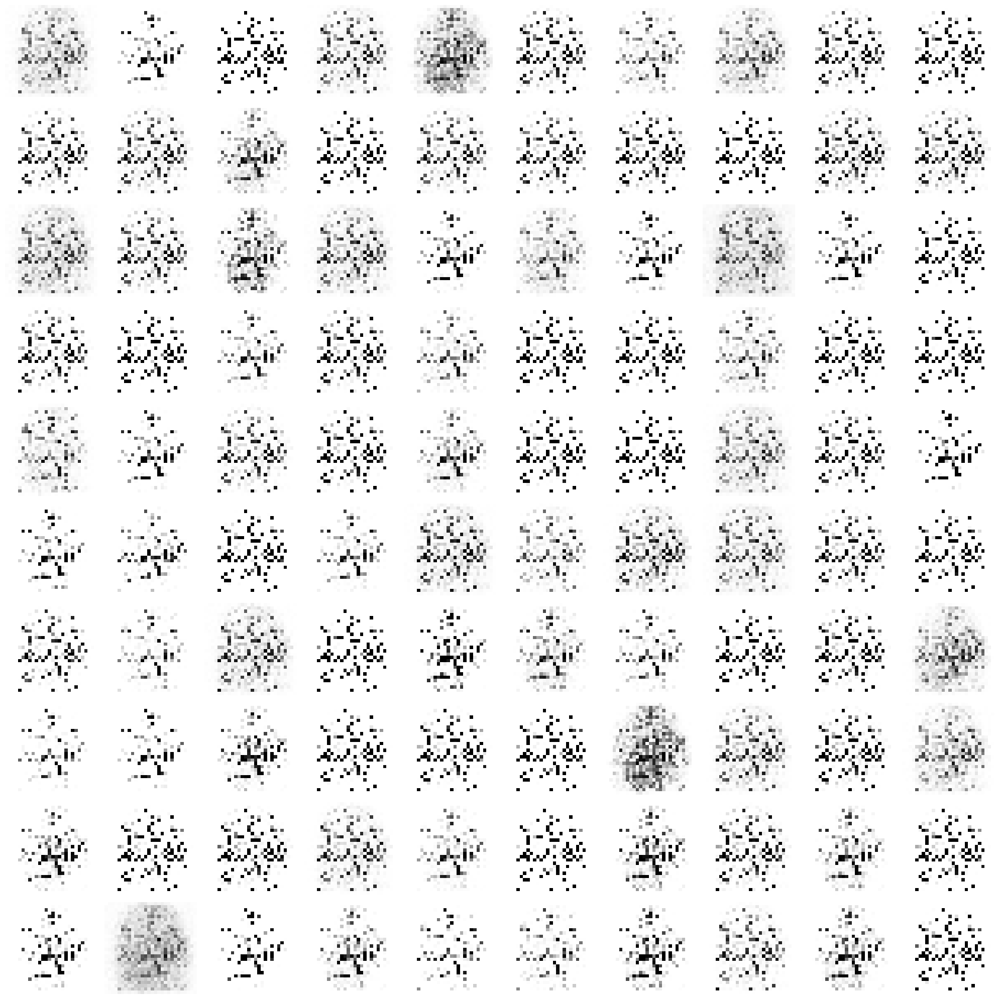

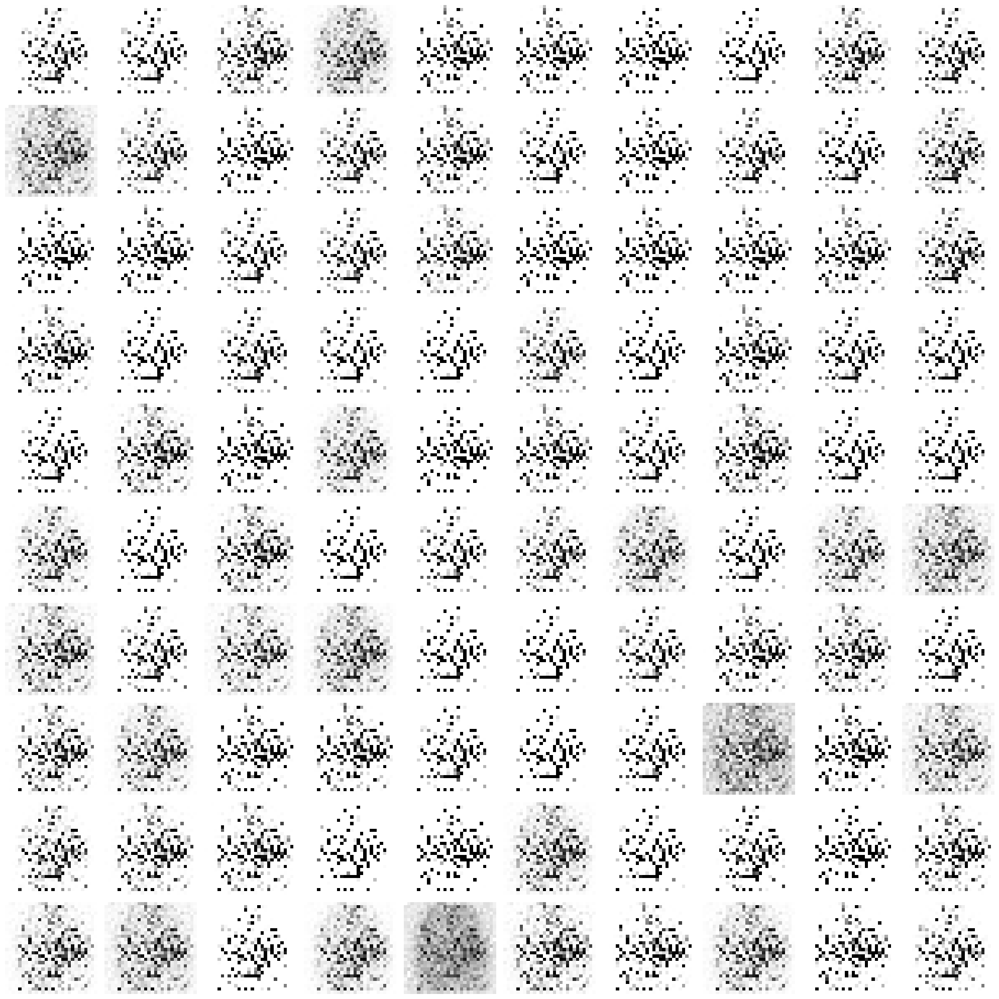

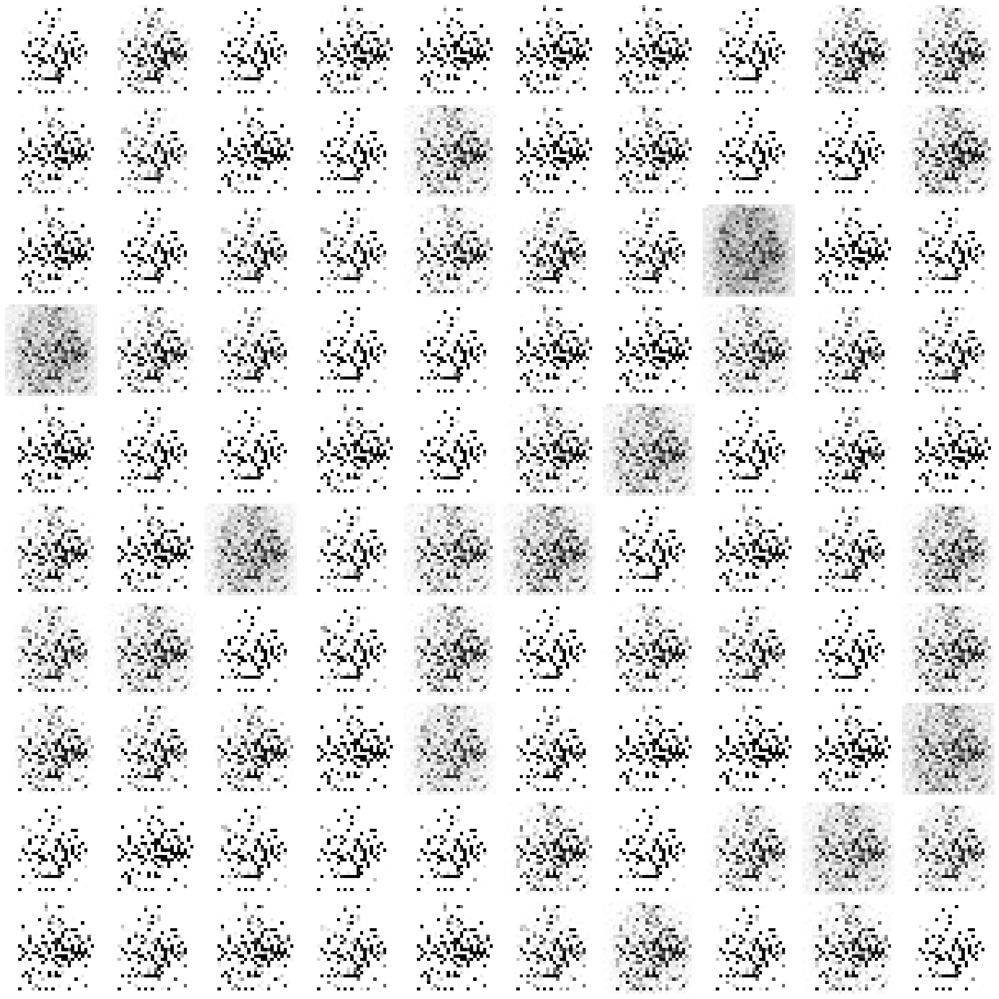

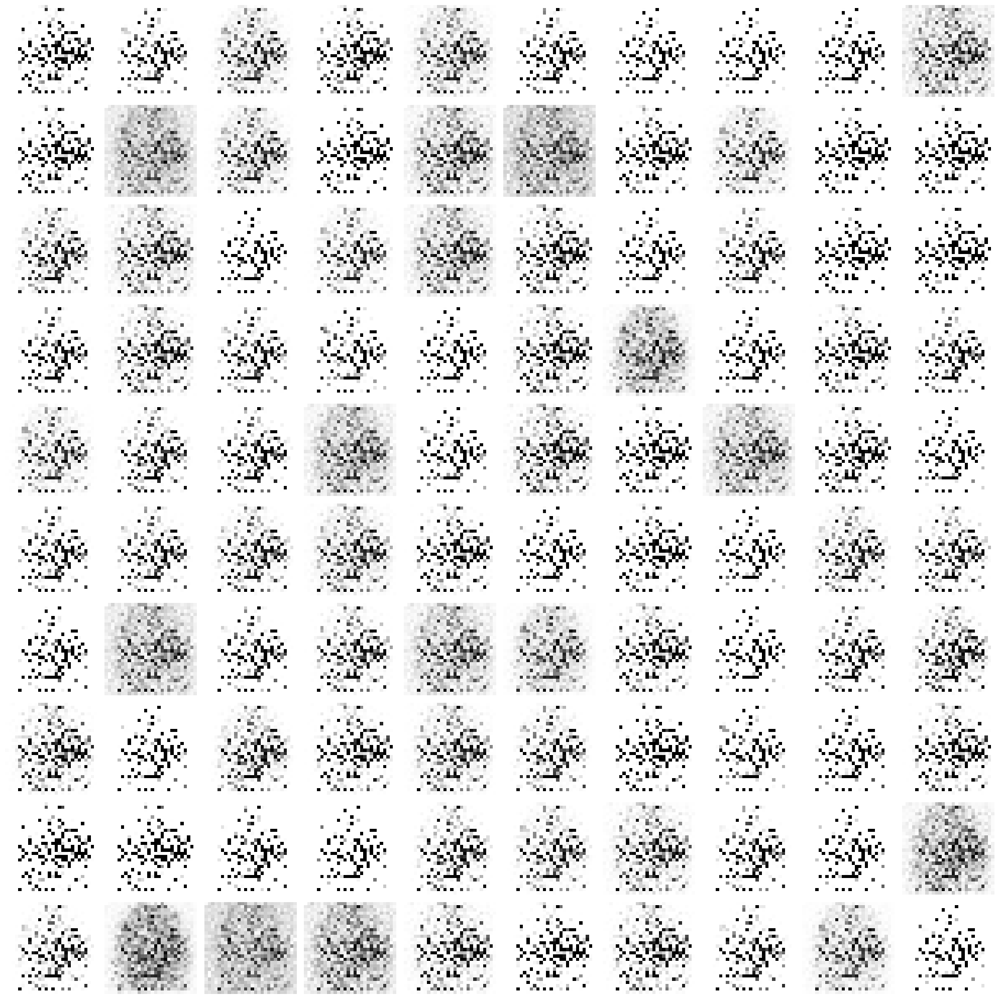

In [14]:
train(epochs=50, batchsize=16384)